# Mapping AHBA gene expression values on distinct cortical units on surface
* First we visualize specific parcellation schemes to map gene-expression values to structurally/functionally/cytoarchitectonically distinct units 
* We chose the Desikan-Killiany-308 region parcellation for subsequent analysis (see **Whitaker, et al., PNAS, 2016**)
* AHBA tissue wells are careully mapped onto parcellation units. 
    * This is accomplished by calculating the minimum euclidian distance between specific wells volumetric MNI coordinates and all parcellation units. 
    * Care is taken to ensure that the MNI coordinates of a specific well fall within the correct lobe as in the parcelaltion
    * To correctly map each well to the correct parcellation unit in the correct hemishere/lobe, we use the detailed structure ontology embedded in the original donor AHBA dataframes
    * example ontology of well #594: 
        * Ontology1: brain 	
        * Ontology2: gray matter 	
        * Ontology3: telencephalon 	
        * Ontology4: cerebral cortex 	
        * Ontology5: frontal lobe 	
        * Ontology6: paracentral lobule, anterior part 	
        * Ontology7: paracentral lobule, anterior part, right 	paracentral lobule, anterior part, right, infe...
        
        
* **NOTE: some cortical parcellation units do not contain any AHBA tissue wells.**

In [37]:
%matplotlib inline
import os 
import nibabel as nb 
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
pd.options.display.max_rows=200
pd.options.display.max_columns=30


parcellation_dir = '/scr/malta1/Github/ENIGMA_TOURETTE/parcellation/'
parcellation_dir = '/Users/kanaan/SCR/Github/ENIGMA_TOURETTE/parcellation'

ahba_dir         = '/scr/malta1/Github/ENIGMA_TOURETTE/AHBA/ahba_data'
ahba_dir         = '/Users/kanaan/SCR/Github/ENIGMA_TOURETTE/AHBA/ahba_data'

# Get fsaverage data


In [2]:
def return_fsaverage_data(freesurfer_dir, fsaverage_id):
    datadir = os.path.join(freesurfer_dir, fsaverage_id, 'surf')
    
    # fsaverage
    fsaverage = dict()
    fsaverage['infl_left']  = os.path.join(datadir, 'lh.inflated')
    fsaverage['infl_right'] = os.path.join(datadir, 'rh.inflated')
    fsaverage['pial_left']  = os.path.join(datadir, 'lh.pial')
    fsaverage['pial_right'] = os.path.join(datadir, 'rh.pial')
    fsaverage['sulc_left']  = os.path.join(datadir, 'lh.sulc')
    fsaverage['sulc_right'] = os.path.join(datadir, 'rh.sulc')
    
    return fsaverage

# Get parcellation annotation data
- parcellation 1: Desikan-Killany – 72 ROIs (Desikan,Neuroimage, 2006)  
    - https://surfer.nmr.mgh.harvard.edu/ftp/articles/desikan06-parcellation.pdf
- parcellation 2: Desikan-Killany sub-parcellation – 308 Cortical ROIs (Whitaker,PNAS, 2016) 
    - http://www.pnas.org/content/113/32/9105.full
- parcellation 3: Glasser Parcellation – 362 Cortical ROIs (Glasser, Nature, 2016) 
    - http://www.nature.com/nature/journal/v536/n7615/full/nature18933.html?foxtrotcallback=true

##### see here for more details 
- https://surfer.nmr.mgh.harvard.edu/fswiki/CorticalParcellation
- https://github.com/KirstieJane/NSPN_WhitakerVertes_PNAS2016/tree/master/FS_SUBJECTS/fsaverageSubP/parcellation

In [3]:
def return_fsaverage_parcellation(freesurfer_dir, fsaverage_id, parcelation):
    parc = os.path.join(parcellation_dir, fsaverage_id, 'label', parcelation)
    parc_labels, parc_ctab, parc_names = nb.freesurfer.read_annot(parc)
    return parc_labels, parc_ctab, parc_names

fsaverage = return_fsaverage_data(parcellation_dir, 'fsaverage')
fsaverage5 = return_fsaverage_data(parcellation_dir, 'fsaverage5')


DK_lh_labels, DK_lh_ctab, DK_lh_names = return_fsaverage_parcellation(parcellation_dir, 'fsaverage', 'lh.aparc.annot')
DK_rh_labels, DK_rh_ctab, DK_rh_names = return_fsaverage_parcellation(parcellation_dir, 'fsaverage', 'rh.aparc.annot')

DK500_lh_labels, DK500_lh_ctab, DK500_lh_names = return_fsaverage_parcellation(parcellation_dir, 'fsaverage', 'lh.500.aparc.annot')
DK500_rh_labels, DK500_rh_ctab, DK500_rh_names = return_fsaverage_parcellation(parcellation_dir, 'fsaverage', 'rh.500.aparc.annot')

HCP_lh_labels, HCP_lh_ctab, HCP_lh_names = return_fsaverage_parcellation(parcellation_dir, 'fsaverage', 'lh.HCP-MMP1.annot')
HCP_rh_labels, HCP_rh_ctab, HCP_rh_names = return_fsaverage_parcellation(parcellation_dir, 'fsaverage', 'rh.HCP-MMP1.annot')

# plot parcellation 

In [4]:
def plot_surf(fsaverage, surf_map_l, surf_map_r,
              threshold=None,  alpha=0.7, cmap='hot', vmin = None, vmax = None,
              bg_on_data = 1, output_file=None,
                  ):
    
    # Import libraries
    import nibabel
    import numpy as np
    import matplotlib.pyplot as plt

    from mpl_toolkits.mplot3d import Axes3D
    from nibabel import gifti

    from nilearn._utils.compat import _basestring
    from nilearn.plotting.img_plotting import _get_colorbar_and_data_ranges
    from nilearn.plotting.surf_plotting import load_surf_data, load_surf_mesh


    # load mesh and derive axes limits
    mesh_left = load_surf_mesh(fsaverage['pial_left'])
    mesh_right = load_surf_mesh(fsaverage['pial_right'])

    coords_left, faces_left = mesh_left[0], mesh_left[1]
    coords_right, faces_right = mesh_right[0], mesh_right[1]

    limits = [-65, 33]

    avg_method = 'mean'
    darkness = 1

    # if no cmap is given, set to matplotlib default
    if cmap is None:
        cmap = plt.cm.get_cmap(plt.rcParamsDefault['image.cmap'])
    else:
        # if cmap is given as string, translate to matplotlib cmap
        if isinstance(cmap, _basestring):
            cmap = plt.cm.get_cmap(cmap)

    def subplot(surf_map, bg_map, subplot_id, coords, faces, elev, azim, vmin=vmin, vmax=vmax, bg_on_data= bg_on_data):

        ax = fig.add_subplot(subplot_id, projection='3d', xlim=limits, ylim=limits)
        ax.view_init(elev=elev, azim=azim)
        ax.set_axis_off()
        p3dcollec = ax.plot_trisurf(coords[:, 0], coords[:, 1], coords[:, 2], triangles=faces, linewidth=0.,
                                    antialiased=False, color='red')

        # If depth_map and/or surf_map are provided, map these onto the surface
        # set_facecolors function of Poly3DCollection is used as passing the
        # facecolors argument to plot_trisurf does not seem to work
        if bg_map is not None or surf_map is not None:

            face_colors = np.ones((faces.shape[0], 4))
            # face_colors[:, :3] = .5*face_colors[:, :3]  # why this?

            if bg_map is not None:
                bg_data = load_surf_data(bg_map)
                if bg_data.shape[0] != coords.shape[0]:
                    raise ValueError('The bg_map does not have the same number '
                                     'of vertices as the mesh.')
                bg_faces = np.mean(bg_data[faces], axis=1)
                bg_faces = bg_faces - bg_faces.min()
                bg_faces = bg_faces / bg_faces.max()
                # control background darkness
                bg_faces *= darkness
                face_colors = plt.cm.gray_r(bg_faces)

            # modify alpha values of background
            face_colors[:, 3] = alpha * face_colors[:, 3]
            # should it be possible to modify alpha of surf data as well?

            if surf_map is not None:
                surf_map_data = surf_map  # load_surf_data(surf_map)
                if len(surf_map_data.shape) is not 1:
                    raise ValueError('surf_map can only have one dimension but has'
                                     '%i dimensions' % len(surf_map_data.shape))
                if surf_map_data.shape[0] != coords.shape[0]:
                    raise ValueError('The surf_map does not have the same number '
                                     'of vertices as the mesh.')

                # create face values from vertex values by selected avg methods
                if avg_method == 'mean':
                    surf_map_faces = np.mean(surf_map_data[faces], axis=1)
                elif avg_method == 'median':
                    surf_map_faces = np.median(surf_map_data[faces], axis=1)

                # if no vmin/vmax are passed figure them out from data
                if vmin is None:
                    vmin = np.nanmin(surf_map_faces)
                if vmax is None:
                    vmax = np.nanmax(surf_map_faces)

                # treshold if inidcated
                if threshold is None:
                    kept_indices = np.where(surf_map_faces)[0]
                else:
                    kept_indices = np.where(np.abs(surf_map_faces) >= threshold)[0]

                surf_map_faces = surf_map_faces - vmin
                surf_map_faces = surf_map_faces / (vmax - vmin)

                # multiply data with background if indicated
                if bg_on_data:
                    face_colors[kept_indices] = cmap(surf_map_faces[kept_indices]) \
                                                * face_colors[kept_indices]
                else:
                    face_colors[kept_indices] = cmap(surf_map_faces[kept_indices])

            p3dcollec.set_facecolors(face_colors)

    fig = plt.figure(figsize=(60, 20))

    subplot(surf_map_l, fsaverage['sulc_left'], 141, coords_left, faces_left, elev=0, azim=180, bg_on_data= bg_on_data)
    subplot(surf_map_l, fsaverage['sulc_left'], 142, coords_left, faces_left, elev=0, azim=0, bg_on_data= bg_on_data)
    subplot(surf_map_r, fsaverage['sulc_right'], 143, coords_right, faces_right, elev=0, azim=180, bg_on_data= bg_on_data)
    subplot(surf_map_r, fsaverage['sulc_right'], 144, coords_right, faces_right, elev=0, azim=0, bg_on_data= bg_on_data)

    plt.tight_layout()
    
    # save figure if output file is given
    if output_file is not None:
        fig.savefig(output_file)
        plt.close(fig)

# Desikan-Killany 72 ROIS (cortical and subcortical)

Number of parcels = 72


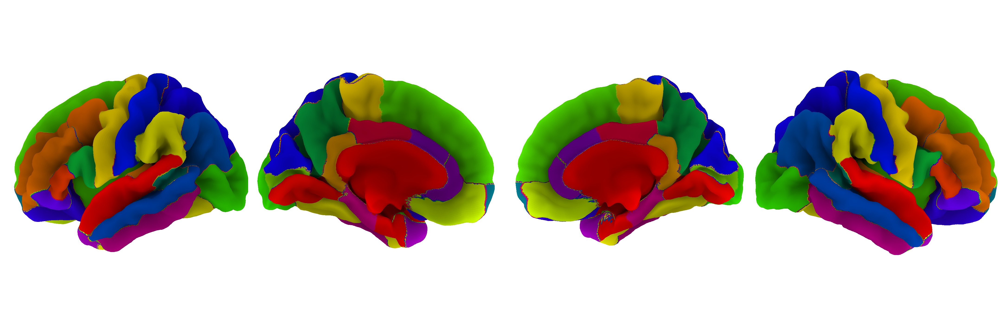

In [17]:
print 'Number of parcels =' ,len(DK_lh_names)*2
plot_surf(fsaverage, DK_lh_labels, DK_rh_labels, cmap = 'prism', alpha = 1)

# Desikan-Killany 308 cortical ROIS

Number of parcels = 308


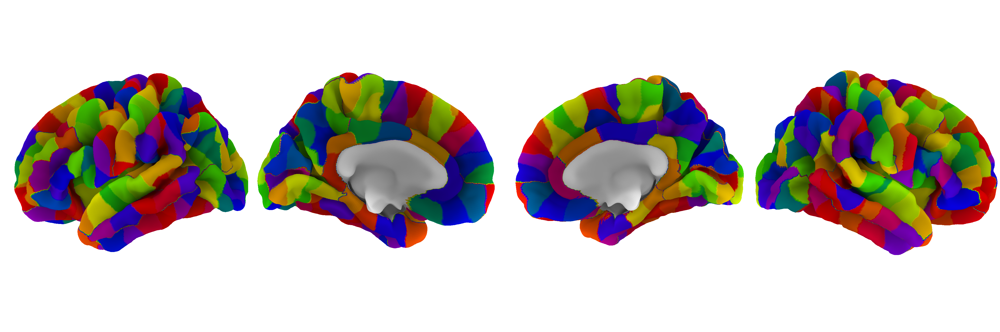

In [18]:
print 'Number of parcels =' ,len(DK500_lh_names)*2
plot_surf(fsaverage, DK500_lh_labels, DK500_rh_labels, cmap = 'prism', alpha = 1)

# Glasser 362 cortical ROIS

Number of parcels = 362


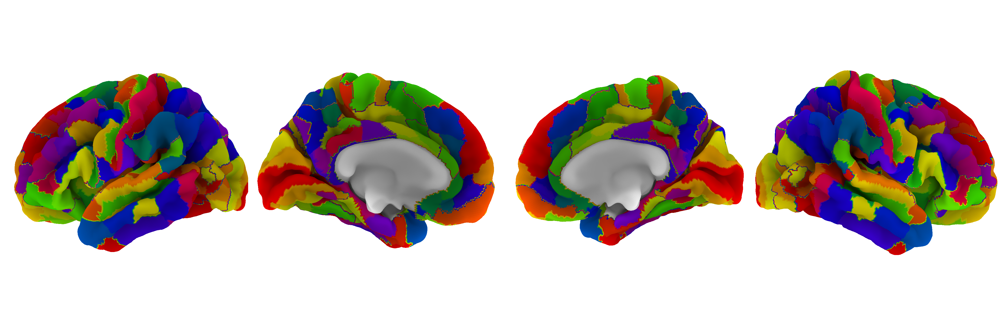

In [19]:
print 'Number of parcels =' ,len(HCP_lh_names)*2
plot_surf(fsaverage, HCP_lh_labels, HCP_rh_labels, cmap = 'prism', alpha = 1)

# Get parcellation centroids




In [20]:
def get_parcellation_centroids(img):
    import os 
    import subprocess
    #os.system('rm -rf /tmp/*')
    
    # get unique labels (ie. parcels)
    labels_data = nb.load(img).get_data().astype(int)
    background_label = 0
    unique_labels = set(np.unique(labels_data)) - set([background_label])

    # find centroids of each parcel and dump into a dataframe
    df_centroids =pd.DataFrame(index = range(1, len(unique_labels)+1), columns = ['mni_coords'])
    
    for cur_label in unique_labels:
        #os.system('fslmaths %s -thr %s -uthr %s /tmp/parc_%s.nii.gz' %(img,cur_label, cur_label, cur_label))
        centriod = subprocess.check_output('fslstats /tmp/parc_%s.nii.gz -c' %cur_label, shell=True)    
        #print cur_label, centriod
        df_centroids.loc[int(cur_label)]['mni_coords'] = centriod.strip()
    
    
    return df_centroids

In [21]:
DK500 = os.path.join(parcellation_dir,'fsaverage/centroids/500.aparc_renum_expanded.nii.gz')
DK500_centr = get_parcellation_centroids(DK500)

In [22]:
DK500_names      = pd.read_csv(os.path.join(parcellation_dir, 'fsaverage/centroids/500.names.txt'),header= None)
DK500_centr_orig = pd.read_csv(os.path.join(parcellation_dir, 'fsaverage/centroids/500.centroids.txt'), header=None)
DK500_lobes      = pd.read_csv(os.path.join(parcellation_dir, 'fsaverage/centroids/500.lobes.txt'), header=None)
DK500_voneconomo = pd.read_csv(os.path.join(parcellation_dir, 'fsaverage/centroids/500.vonEconomoRegions.txt'), header=None)

DK500_stats = pd.concat([DK500_names, DK500_lobes,DK500_voneconomo, DK500_centr_orig,],axis = 1)
DK500_stats.index += 1 
DK500_stats = pd.concat([DK500_stats, DK500_centr], axis=1)
DK500_stats.columns = ['Names', 'Lobes', 'VonEconomo','mni_centroid_orig', 'mni_centroid_calc']

DK500_stats.head()


,Names,Lobes,VonEconomo,mni_centroid_orig,mni_centroid_calc
1,Left-Cerebral-White-Matter,.,0,-27.965157 -19.013702 17.919528,-25.871097 -17.032385 19.170759
2,Left-Lateral-Ventricle,.,0,-14.455663 -13.693461 13.713674,-14.455663 -13.693461 13.713674
3,Left-Inf-Lat-Vent,.,0,-33.906934 -22.284672 -15.821168,-33.906934 -22.284672 -15.821168
4,Left-Cerebellum-White-Matter,.,0,-17.305373 -53.431573 -36.017154,-17.305373 -53.431573 -36.017154
5,Left-Cerebellum-Cortex,.,0,-22.265823 -64.366296 -37.674831,-22.265823 -64.366296 -37.674831


# Load AHBA dataset 
* Matrix is wells(3702) x genes(20737) with an additonal 28 columns of metadata 

In [23]:
AHBA = pd.read_csv(os.path.join(ahba_dir, 'AHBA_20737.csv'),index_col=0)
META = AHBA.iloc[:,-28:]

# Drop wells outstide of the cerebral cortex
* Accomplished based on the ontology metadata 

In [24]:
ontology3        = set([AHBA.loc[well]['Ontology_3'] for well in AHBA.index])
CORTEX_wells     = [well for well in AHBA.index if AHBA.loc[well]['Ontology_3'] == 'cerebral cortex' ]
NON_CORTEX_wells = [well for well in AHBA.index if well not in CORTEX_wells]
print sorted(ontology3)
print ''
print 'Number of tissue samples (ie wells) within  the cerbral cortex =', len(CORTEX_wells)
print 'Number of tissue samples (ie wells)outside the cerbral cortex =', len(NON_CORTEX_wells)
print 'Sum should equal 3702 total wells. Check value here >>>> ', len(CORTEX_wells) + len(NON_CORTEX_wells)

['arcuate nucleus of medulla', 'central glial substance', 'cerebellum', 'cerebral cortex', 'cerebral nuclei', 'cochlear nuclei', 'cuneate nucleus', 'dorsal motor nucleus of the vagus', 'epithalamus', 'gracile nucleus', 'hypoglossal nucleus', 'hypothalamus', 'inferior olivary complex', 'lateral ventricle', 'medullary reticular formation', 'midbrain tectum', 'midbrain tegmentum', 'pons', 'pretectal region', 'raphe nuclei of medulla', 'spinal trigeminal nucleus', 'subthalamus', 'telencephalic commissures', 'telencephalic white matter tracts', 'thalamus', 'vestibular nuclei']

Number of tissue samples (ie wells) within  the cerbral cortex = 1950
Number of tissue samples (ie wells)outside the cerbral cortex = 1752
Sum should equal 3702 total wells. Check value here >>>>  3702


In [25]:
AHBA_CORTEX = AHBA.drop(NON_CORTEX_wells, axis =0)

In [26]:
AHBA_CORTEX.iloc[:,-28:].head()

,structure_id,slab_num,slab_type,structure_acronym,structure_name,polygon_id,mri_voxel_x,mri_voxel_y,mri_voxel_z,mni_x,mni_y,mni_z,donor,parent_structure_id,hemisphere,graph_order,structure_id_path,color_hex_triplet,Ontology,Ontology_0,Ontology_1,Ontology_2,Ontology_3,Ontology_4,Ontology_5,Ontology_6,Ontology_7,Ontology_8
594,4077,22,CX,PCLa-i,"paracentral lobule, anterior part, right, infe...",37470,87,52,116,5.9,-27.7,49.7,donor1,E8CF59,R,60.0,/4005/4006/4007/4008/4009/4071/4075/4077/,E8CF59,brain//gray matter//telencephalon//cerebral co...,brain,gray matter,telencephalon,cerebral cortex,frontal lobe,"paracentral lobule, anterior part","paracentral lobule, anterior part, right","paracentral lobule, anterior part, right, infe...",NaN
2785,4266,17,CX,CA4,"CA4 field, right",41142,63,104,106,31.1,-31.3,-7.3,donor1,FFC966,R,139.0,/4005/4006/4007/4008/4219/4249/12895/4266/,FFC966,brain//gray matter//telencephalon//cerebral co...,brain,gray matter,telencephalon,cerebral cortex,limbic lobe,hippocampal formation,CA4 field,"CA4 field, right",NaN
2793,4267,17,CX,DG,"dentate gyrus, right",41141,63,104,107,31.1,-32.3,-7.1,donor1,FFB566,R,127.0,/4005/4006/4007/4008/4219/4249/12891/4267/,FFB566,brain//gray matter//telencephalon//cerebral co...,brain,gray matter,telencephalon,cerebral cortex,limbic lobe,hippocampal formation,dentate gyrus,"dentate gyrus, right",NaN
2858,4251,17,CX,S,"subiculum, left",41212,114,108,100,-22.6,-27.4,-13.8,donor1,FFD366,L,144.0,/4005/4006/4007/4008/4219/4249/12896/4251/,FFD366,brain//gray matter//telencephalon//cerebral co...,brain,gray matter,telencephalon,cerebral cortex,limbic lobe,hippocampal formation,subiculum,"subiculum, left",NaN
2850,4254,17,CX,CA1,"CA1 field, left",41211,124,107,100,-33.2,-27.4,-12.9,donor1,FFBA66,L,129.0,/4005/4006/4007/4008/4219/4249/12892/4254/,FFBA66,brain//gray matter//telencephalon//cerebral co...,brain,gray matter,telencephalon,cerebral cortex,limbic lobe,hippocampal formation,CA1 field,"CA1 field, left",NaN


# Calculate minimum euclidian distance for each well to all parcellation units
* In other words, locate AHBA well location within the DK500 parcellation 
* This is accomplished to map gene expression values from each well to the parcellation units 
* Note that some units of he DK500 parcellation do not contain any wells. 


* Example:
    * ***Romme, BiolPSych, 2017***: "Cortical samples were volumetrically mapped to the Desikan–Killiany cortical parcellation atlas (DK; 57 regions per hemisphere) (Figure 1) (33), computing the minimal Euclidean distance of the reported Montreal Neurological Institute three-dimensional coordinates of each donor sample to the Montreal Neurological Institute coordinates of all voxels of FreeSurfer’s software’sfsaverage subject."

In [27]:
from scipy.spatial.distance import euclidean
from operator import itemgetter

AHBA_CORTEX_MAPPED = AHBA_CORTEX

ontology4 = set([AHBA_CORTEX.loc[well]['Ontology_4'] for well in AHBA_CORTEX.index])
ontology4 = ['frontal lobe','insula','limbic lobe','occipital lobe','parietal lobe','temporal lobe']

for well in AHBA_CORTEX.index:
    
    # get well metdata
    ontology     = AHBA_CORTEX.loc[well]['Ontology_4'].replace(' lobe','')
    hemi         = AHBA_CORTEX.loc[well]['hemisphere'].lower() + 'h'
    ahba_coords  = tuple([AHBA_CORTEX.loc[well]['mni_x'], AHBA_CORTEX.loc[well]['mni_y'], AHBA_CORTEX.loc[well]['mni_z']])
    #print well, ontology, hemi
    
    # AHBA contains Insula and limbic system as lobes...
    # DK500 considers Insula within frontal lobe
    # DK500 considers limbiclobe within temporal lobe
    if ontology == 'insula':
        ontology = 'frontal'
    elif ontology == 'limbic':
        ontology = 'temporal'
        
    drop_well_lobes = [i for i in DK500_stats.index if  DK500_stats.loc[i]['Lobes'] != ontology]
    drop_well_hemi  = [i for i in DK500_stats.index if DK500_stats.loc[i]['Names'][0:2] != hemi]
    DK500_stats_lobe_hemi = DK500_stats.drop(drop_well_lobes + drop_well_hemi, axis = 0)
        
    
    # calculate euclidian distance between well mni coordinates and parc_500 centroids
    euclidean_distance = {}
    for label_id in DK500_stats_lobe_hemi.index:
        centroid = [float(d) for d in DK500_stats_lobe_hemi.loc[label_id]['mni_centroid_orig'].split()] 
        euclidean_distance[label_id] = euclidean(ahba_coords, centroid)
        
    #find name of centroid with minumum euclidian distance to well coordinates
    min_dist_parcel = min(euclidean_distance, key=euclidean_distance.get)
    
    AHBA_CORTEX_MAPPED.loc[well,'DK500_id'] = min_dist_parcel
    AHBA_CORTEX_MAPPED.loc[well,'DK500_name'] = DK500_stats_lobe_hemi.loc[min_dist_parcel]['Names']
    AHBA_CORTEX_MAPPED.loc[well,'DK500_VonEconomo'] = DK500_stats_lobe_hemi.loc[min_dist_parcel]['VonEconomo']
    AHBA_CORTEX_MAPPED.loc[well,'DK500_centroid'] = DK500_stats_lobe_hemi.loc[min_dist_parcel]['mni_centroid_calc']
    
    

In [28]:
AHBA_CORTEX_MAPPED  = AHBA_CORTEX_MAPPED.astype({col: int for col in ['DK500_VonEconomo', 'DK500_id']})
AHBA_CORTEX_MAPPED.iloc[:,-28:].head()

,structure_name,polygon_id,mri_voxel_x,mri_voxel_y,mri_voxel_z,mni_x,mni_y,mni_z,donor,parent_structure_id,hemisphere,graph_order,structure_id_path,color_hex_triplet,Ontology,Ontology_0,Ontology_1,Ontology_2,Ontology_3,Ontology_4,Ontology_5,Ontology_6,Ontology_7,Ontology_8,DK500_id,DK500_name,DK500_VonEconomo,DK500_centroid
594,"paracentral lobule, anterior part, right, infe...",37470,87,52,116,5.9,-27.7,49.7,donor1,E8CF59,R,60.0,/4005/4006/4007/4008/4009/4071/4075/4077/,E8CF59,brain//gray matter//telencephalon//cerebral co...,brain,gray matter,telencephalon,cerebral cortex,frontal lobe,"paracentral lobule, anterior part","paracentral lobule, anterior part, right","paracentral lobule, anterior part, right, infe...",NaN,257,rh_paracentral_part1,1,14.000382 -33.222477 48.560398
2785,"CA4 field, right",41142,63,104,106,31.1,-31.3,-7.3,donor1,FFC966,R,139.0,/4005/4006/4007/4008/4219/4249/12895/4266/,FFC966,brain//gray matter//telencephalon//cerebral co...,brain,gray matter,telencephalon,cerebral cortex,limbic lobe,hippocampal formation,CA4 field,"CA4 field, right",NaN,255,rh_parahippocampal_part1,1,26.293258 -36.242080 -8.880991
2793,"dentate gyrus, right",41141,63,104,107,31.1,-32.3,-7.1,donor1,FFB566,R,127.0,/4005/4006/4007/4008/4219/4249/12891/4267/,FFB566,brain//gray matter//telencephalon//cerebral co...,brain,gray matter,telencephalon,cerebral cortex,limbic lobe,hippocampal formation,dentate gyrus,"dentate gyrus, right",NaN,255,rh_parahippocampal_part1,1,26.293258 -36.242080 -8.880991
2858,"subiculum, left",41212,114,108,100,-22.6,-27.4,-13.8,donor1,FFD366,L,144.0,/4005/4006/4007/4008/4219/4249/12896/4251/,FFD366,brain//gray matter//telencephalon//cerebral co...,brain,gray matter,telencephalon,cerebral cortex,limbic lobe,hippocampal formation,subiculum,"subiculum, left",NaN,101,lh_parahippocampal_part2,1,-24.550021 -36.896977 -9.590038
2850,"CA1 field, left",41211,124,107,100,-33.2,-27.4,-12.9,donor1,FFBA66,L,129.0,/4005/4006/4007/4008/4219/4249/12892/4254/,FFBA66,brain//gray matter//telencephalon//cerebral co...,brain,gray matter,telencephalon,cerebral cortex,limbic lobe,hippocampal formation,CA1 field,"CA1 field, left",NaN,100,lh_parahippocampal_part1,1,-27.033433 -24.535429 -24.211577


In [30]:
for i in DK500_stats.index:
    DK500_stats.loc[i, 'AHBA_sample_count' ] = list(AHBA_CORTEX_MAPPED['DK500_id']).count(i)
DK500_stats['AHBA_sample_count'] = DK500_stats['AHBA_sample_count'].astype(int)

In [31]:
DK500_stats.iloc[41:,:].head()

In [33]:
AHBA_CORTEX_MAPPED_AV = AHBA_CORTEX_MAPPED.groupby('DK500_name').mean().iloc[:,:-12]

In [34]:
AHBA_CORTEX_MAPPED_AV.head()

,61E3.4,A1BG,A1CF,A26C1B,A2BP1,A2LD1,A2M,A2ML1,A3GALT2P,A4GALT,A4GNT,AAAS,AACS,AADAC,AADACL1,...,ZSWIM6,ZSWIM7,ZUFSP,ZW10,ZWILCH,ZWINT,ZXDA,ZXDB,ZXDC,ZYG11A,ZYG11B,ZYX,ZZEF1,ZZZ3,na
DK500_name,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
lh_bankssts_part1,12.666732,5.114113,1.718201,6.114896,11.971507,2.998349,8.093097,5.370755,3.386562,3.710923,1.850970,5.921848,5.781541,1.737047,8.931340,...,9.117639,8.064463,7.253600,5.286653,4.395169,3.128534,5.949241,4.653540,5.431723,1.869484,7.975926,6.933987,5.181494,6.498197,4.141282
lh_bankssts_part2,12.496346,4.957103,1.815888,6.295019,11.879731,3.012338,8.289217,5.092922,3.486416,3.575456,1.718557,5.982165,6.037862,1.818039,8.832649,...,8.958512,8.379839,7.294705,5.432583,4.530157,3.151770,5.783704,4.556338,5.362637,1.972028,7.940407,6.966423,5.094837,6.418277,4.074226
lh_caudalanteriorcingulate_part1,12.887105,4.903357,1.680460,5.945584,11.433935,3.208960,8.406014,5.026118,2.679456,4.297751,1.770353,5.805256,6.155561,1.629515,8.378954,...,8.859364,8.366825,7.028862,5.139938,4.818348,2.990554,5.905723,4.508595,5.453801,2.070203,7.736556,6.449750,4.993055,6.580809,4.299065
lh_caudalmiddlefrontal_part1,12.525774,4.885810,2.079022,6.307948,11.984064,2.670323,8.423703,5.703586,3.502855,3.369464,1.655759,6.142038,6.099191,1.734157,8.866570,...,9.091369,8.137439,7.354605,5.435279,4.727100,3.447663,5.850009,4.436985,5.440160,2.355613,7.885988,6.993981,5.116444,6.277404,4.195520
lh_caudalmiddlefrontal_part2,12.543270,5.030206,1.772424,6.360586,11.878972,2.945460,8.515545,5.035692,3.708679,3.687768,1.551054,6.017217,6.214617,1.664172,8.940838,...,9.031539,8.658495,7.286797,5.491636,4.581974,2.957415,5.853697,4.519349,5.320613,1.600945,7.901950,7.052122,5.110954,6.405904,4.039562


In [35]:
def plot_gene(GENE, cmap ):
    
    # Drop noncortical ROIS from DK500 parcellation 
    # These are the first 42 labels (white matter, Corpus collosum, basal ganglia, brainstem, cerebellum)
    DK500_lh_labels_thr = DK500_lh_labels
    DK500_lh_labels_thr[DK500_lh_labels_thr < 42] = 0

    DK500_rh_labels_thr = DK500_rh_labels
    DK500_rh_labels_thr[DK500_rh_labels_thr < 42] = 0
    
    # Replace label_id with label_names for each vertex in the fsvarege parcellation
    # used subsequently to map gene-expression values
    DK500_lh_labels_name = []
    for i in DK500_lh_labels_thr:
        if i != 0:
            DK500_lh_labels_name.append(DK500_stats.loc[i]['Names'])
        elif i ==0:
            DK500_lh_labels_name.append(0)

    DK500_rh_labels_name = []
    for i in DK500_rh_labels_thr:
        if i != 0:
            DK500_rh_labels_name.append(DK500_stats.loc[i]['Names'])
        elif i ==0:
            DK500_rh_labels_name.append(0)
    
    # replace label_name by gene-expression value for each vertex in the fsaverage parcellation 
    gene_expression_lh = []
    for parcel in DK500_lh_labels_name:
        if parcel in AHBA_CORTEX_MAPPED_AV.index:
            gene_expression_lh.append(AHBA_CORTEX_MAPPED_AV.loc[parcel][GENE])
        else:
            gene_expression_lh.append(0)

    gene_expression_rh = []
    for parcel in DK500_rh_labels_name:
        if parcel in AHBA_CORTEX_MAPPED_AV.index:
            gene_expression_rh.append(AHBA_CORTEX_MAPPED_AV.loc[parcel][GENE])
        else:
            gene_expression_rh.append(0)

    vrange = [i for i in gene_expression_lh if i != 0]
    vmin = min(vrange)
    vmax = max(vrange)
    print vmin, vmax
    plot_surf(fsaverage, np.array(gene_expression_lh), np.array(gene_expression_rh), 
              cmap = cmap, alpha = 1, vmin = vmin, vmax = vmax)
    
    fig = plt.figure(figsize=(8, 3))
    ax1 = fig.add_axes([0.05, 0.80, 0.9, 0.15])
    norm = mpl.colors.Normalize(vmin= vmin, vmax=vmax)
    cb1 = mpl.colorbar.ColorbarBase(ax1, cmap=cmap,norm=norm,orientation='horizontal')

8.44044417171 8.97274369832


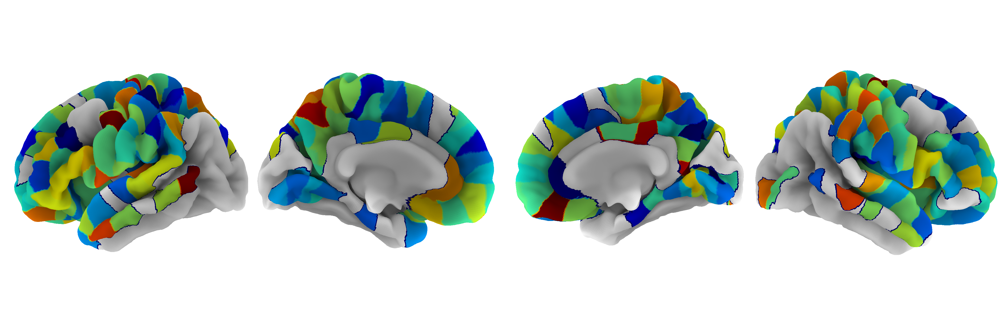

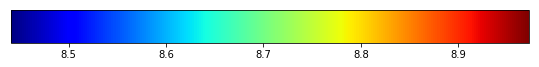

In [38]:
plot_gene('SLITRK1', mpl.cm.jet)

8.44044417171 8.97274369832


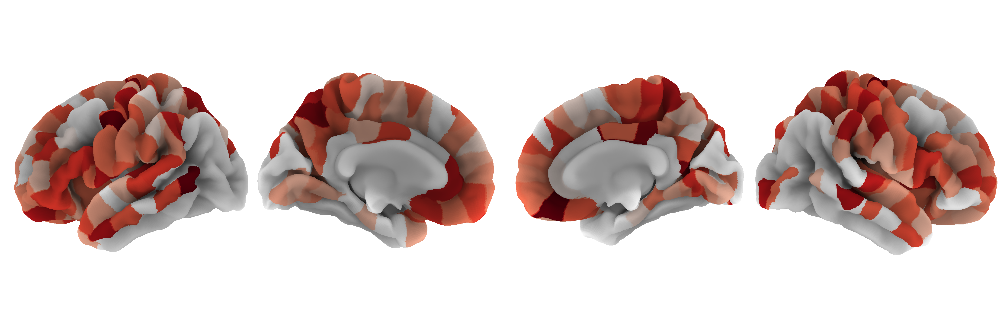

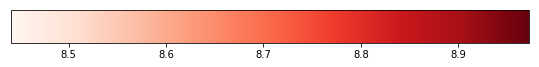

In [40]:
plot_gene('SLITRK1', mpl.cm.Reds)

7.73889217293 9.04045889874


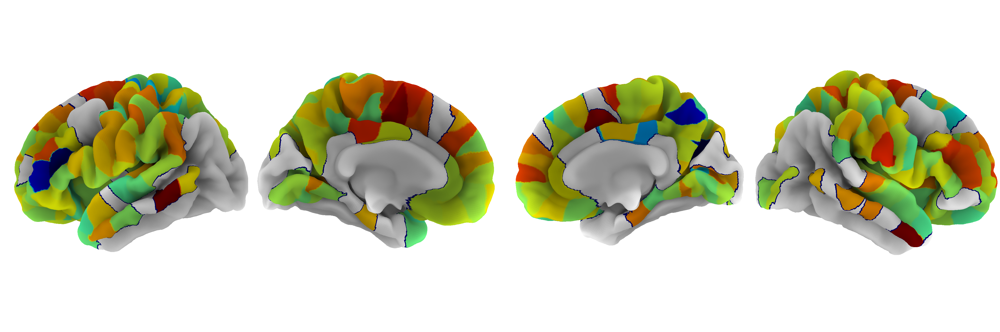

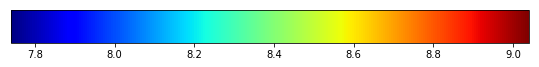

In [41]:
plot_gene('GAD1', mpl.cm.jet)